# Health Insurance EDA

## Created by Precious Batta

### Dataset avaible at:

### IMPORT LIBRARIES

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from IPython.display import display
%matplotlib inline

### IMPORT DATASETS

In [4]:
# Import training data
df_train = pd.read_csv('Train.csv') 

# Import testing data
df_test = pd.read_csv('Test.csv')

# Target varaiable for customer response
Target = df_train.Response

# Drop ID,response columns from train data
train_data = df_train.drop(['ID','Response'], axis=1)

# Drop ID cloumn from test data
test_data = df_test.drop('ID', axis=1)

### CONCAT TRAIN AND TEST DATFRAME

In [5]:
# JOIN TRAIN AND TEST DATAFRAME
df = pd.concat([train_data,test_data]).reset_index(drop=True)
df.head()

,City_Code,Region_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,Health Indicator,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium
0,C3,3213,Rented,Individual,36,36,No,X1,14+,3.0,22,11628.0
1,C5,1117,Owned,Joint,75,22,No,X2,NaN,NaN,22,30510.0
2,C5,3732,Owned,Individual,32,32,No,NaN,1.0,1.0,19,7450.0
3,C24,4378,Owned,Joint,52,48,No,X1,14+,3.0,19,17780.0
4,C8,2190,Rented,Individual,44,44,No,X2,3.0,1.0,16,10404.0


In [6]:
# RENAME COLUMN
df = df.rename(columns={'Health Indicator': 'health_indicator'})

### HIGH LEVEL EDA/ Data Cleaning

In [7]:
df.describe()

,Region_Code,Upper_Age,Lower_Age,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium
count,72687.000000,72687.000000,72687.000000,43833.000000,72687.000000,72687.000000
mean,1737.573101,44.862713,42.741632,2.439486,15.122140,14194.856472
std,1428.388402,17.293563,17.304194,1.029450,6.329295,6562.564815
min,1.000000,18.000000,16.000000,1.000000,1.000000,2152.000000
25%,527.000000,28.000000,27.000000,1.000000,12.000000,9254.000000
50%,1391.000000,44.000000,40.000000,3.000000,17.000000,13200.000000
75%,2681.000000,59.000000,57.000000,3.000000,20.000000,18144.000000
max,6194.000000,75.000000,75.000000,4.000000,22.000000,43776.000000


In [8]:
# CHECKING FOR NULL VALUES
pd.isna(df).sum()

City_Code                      0
Region_Code                    0
Accomodation_Type              0
Reco_Insurance_Type            0
Upper_Age                      0
Lower_Age                      0
Is_Spouse                      0
health_indicator           16718
Holding_Policy_Duration    28854
Holding_Policy_Type        28854
Reco_Policy_Cat                0
Reco_Policy_Premium            0
dtype: int64

In [9]:
df = df.dropna().reset_index()

### DATA VISUALIZATION

### Demographic Plot

In [10]:

px.histogram(df.Upper_Age)


In [11]:
px.histogram(df.Lower_Age)


In [12]:
fig = px.pie(names='Is_Spouse',
 data_frame=df,color_discrete_sequence=['#DC7633','#F5B041'],
 color='Is_Spouse', title=' Fig.1 Married Customers',hole=.3)
fig.update_traces(textposition='inside', textinfo='percent+label')

In [13]:
fig = px.pie(names='Reco_Insurance_Type',
 data_frame=df,color_discrete_sequence=['#DC7633','#F5B041'],
 color='Reco_Insurance_Type', title='Recommended Insurance Type',hole=.3)
fig.update_traces(textposition='inside', textinfo='percent+label')

In [14]:
fig = px.pie(names='health_indicator',
 data_frame=df,
 color='health_indicator', title='Health Indicator of Customers',hole=.3)
fig.update_traces(textposition='inside', textinfo='percent+label')

In [15]:
fig = px.pie(names='Holding_Policy_Type',
 data_frame=df,
 color='Holding_Policy_Type', title='Holding Policy Type',hole=.3)

fig.update_traces(textposition='inside', textinfo='percent+label')

In [16]:
fig = px.pie(names='Holding_Policy_Duration',
 data_frame=df,
 color='Holding_Policy_Duration', title='Holding Policy Duration of Customers',hole=.3)
fig.update_traces(textposition='inside', textinfo='percent+label')

In [17]:
df = df.drop('index',axis=1)

array([[<AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>]], dtype=object)

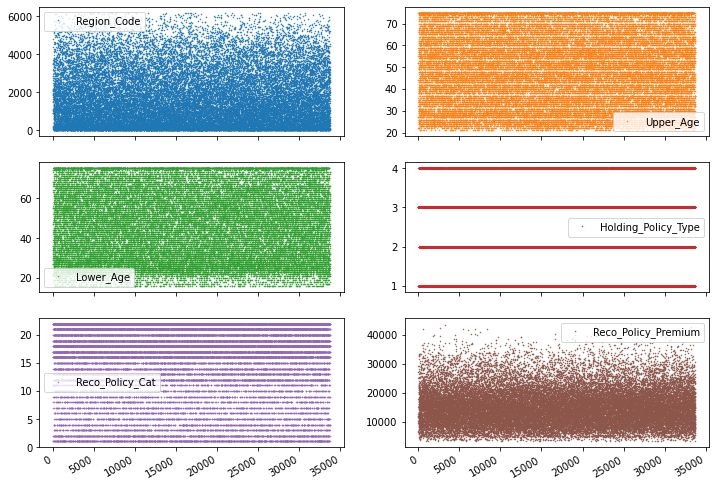

In [18]:
# ploting the numerical features of the dataset
df.plot(lw=0, marker=".", subplots=True, layout=(-1,2),figsize=(12,9), markersize=1)

We can deduce continuous and discerte features from the plot

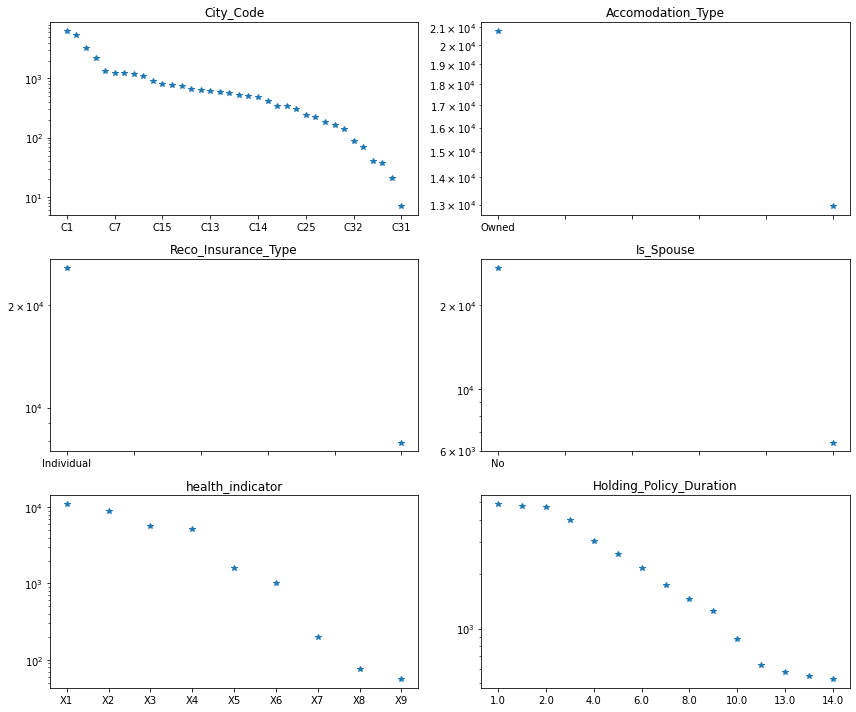

In [19]:
# plot non- numerical features of the dataset
fig, axes = plt.subplots(ncols=2, nrows=3, figsize=(12, 10))

# Identify non-numerical features
df_non_numerical = df.select_dtypes(exclude=["int64",'float64'])

# Loop through features and put each subplot on a matplotlib axis object
for col, ax in zip(df_non_numerical.columns, axes.ravel()):

    # Selects one single feature and counts number of occurrences per unique value
    df_non_numerical[col].value_counts().plot(

        # Plots this information in a figure with log-scaled y-axis
        logy=True, title=col, lw=0, marker="*", ax=ax)
    
plt.tight_layout()

From the plot we can deduce;
1.  Most respondents live in City_code 'C1'
2.  Most respondents are home owners
3.  Most respondents are not married
4.  Most respondents are recommended individual health insurance type
5.  Most respondents have health indicator X1
6.  Most respondents are new customer(Holding_Policy_Duration<5 is higher)


In [20]:
# from the numerial columns, we can investigate further to see more pattern between discret and contiuous variables

# filter continuous and discrete columns
cols_continuous = df.select_dtypes(include=["int64",'float64']).nunique() >= 25
df_continuous = df[cols_continuous[cols_continuous].index]

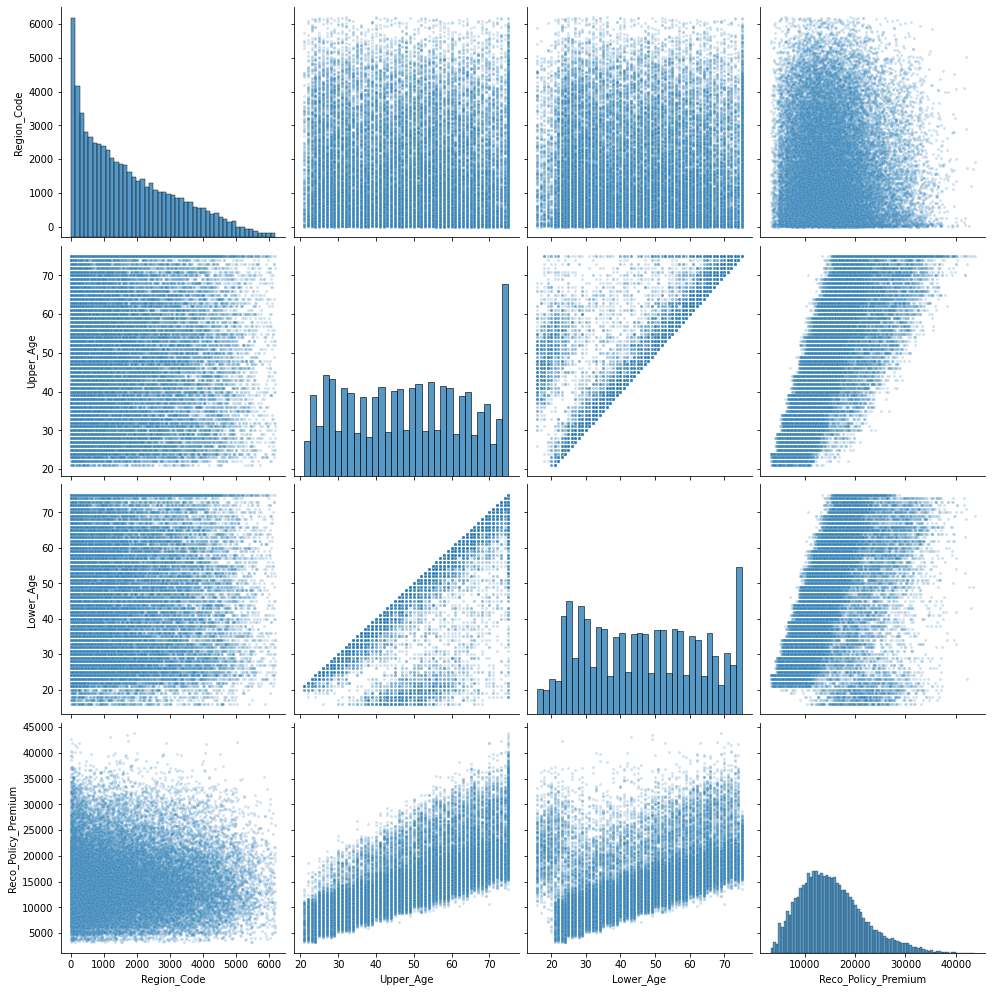

In [21]:
# plot continuous variable
sns.pairplot(df_continuous, height=3.5, plot_kws={"s": 9, "alpha": 0.2})

There is an interaction between the Upper_Age and Lower_Age to the Recommended Annual Premium

<AxesSubplot:>

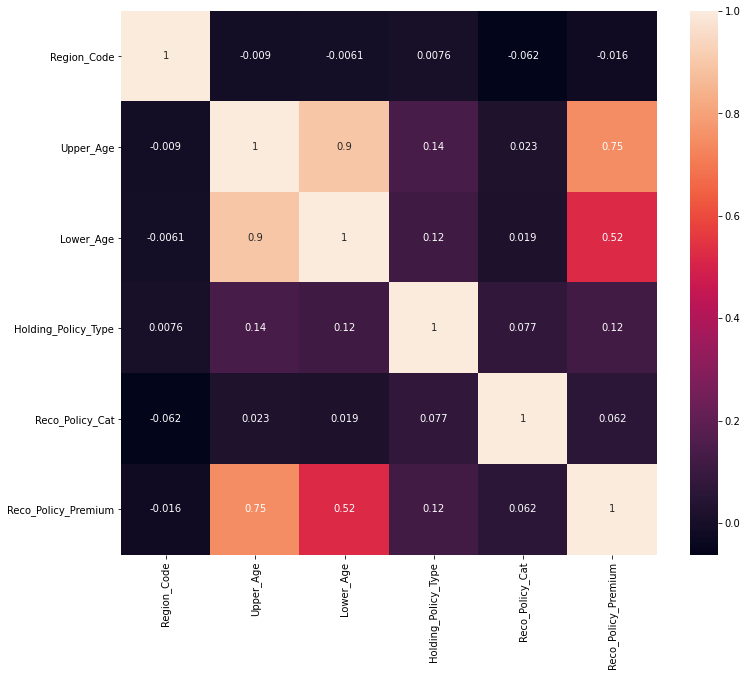

In [22]:
plt.figure(figsize=(12,10))
sns.heatmap(df.corr(),annot=True)

From the correlation plot we can observe a case of multicollinearity between Upper_Age and Lower_Age

Recommendation:
1.   Before model training Lower_Age can be dropped as Upper_age already has high correlation with annual premium
2.  We will an ANOVA Test to extrapolate correlation betwenn categorical variable with Annual Premium

In [42]:
fig = px.box(x='Reco_Policy_Premium',
 data_frame=df,
 title=' Annual Recommended Premium')
fig.show()

We can investigate customer who have to pay upper fence of 32,000

In [43]:
df_premium_upperfence = df[df.Reco_Policy_Premium>32000]

In [10]:
fig = px.box(x='Reco_Policy_Premium',
 data_frame=df,
 color='Is_Spouse', title='Annual Recommended Premium by Spouse')
fig.show()

It can be seen from the plot
1.  Married people have a higher base,mean and celing annual premium
2.  Large amount of Single people pay over the upper fence